# RISNet Exploration Notebook
Aaron Gabrielle Dichoso

In [1]:
import numpy as np
import pandas as pd
import cv2
import os
import PIL.Image as Image
import importlib
import test_utils as utils

In [2]:
include_PVTs = False

## 1. Evaluation of Pre-Trained RISNet

In [3]:
imgs = [utils.get_img_root() + f for f in os.listdir(utils.get_img_root()) if f.endswith('.tif') or f.endswith('.png')]

In [4]:
gts = [utils.get_gt_root() + f for f in os.listdir(utils.get_gt_root()) if f.endswith('.tif') or f.endswith('.png')]

In [5]:
networks = ['PreyNet', 'RISNet',  'RISNet_ND', 'SINet_V2', "PreyNet_w_PVT", "SINet_V2_w_PVT", "PreyNet_w_Zoom", "SINet_V2_w_Zoom"]
# networks_PVTs = ["PreyNet_w_PVT", "SINet_V2_w_PVT"]
#
# if include_PVTs:
#     networks = networks + networks_PVTs

In [6]:
pred_roots = ["Results/" + network + "/ACOD-12K/" for network in networks]
preds_networks = [[pred_root + f for f in os.listdir(pred_root) if f.endswith('.tif') or f.endswith('.png')] for pred_root in pred_roots]

In [7]:
plants=["bean", "cucumber", "kiwi", "loquat", "peach", "pepper", "plum", "tomato", "watermelon", "zucchini"]
ACOD_results = {
    plant: [img_dir.split("/")[4] for img_dir in imgs if plant in img_dir]
    for plant in plants
}

In [8]:
img_root_train = "Datasets/ACOD-12K/Train/Imgs/"
img_root = "Datasets/ACOD-12K/Test/Imgs/"

imgs_train = [img_root_train + f for f in os.listdir(img_root_train) if f.endswith('.tif') or f.endswith('.png')]

plants_count = {
    plant: [img_dir.split("/")[4] for img_dir in imgs_train if plant in img_dir]
    for plant in plants
}

In [9]:
train_count = {}
for plant in plants:
    train_count[plant] = len(plants_count[plant])
train_count

{'bean': 39,
 'cucumber': 400,
 'kiwi': 400,
 'loquat': 142,
 'peach': 444,
 'pepper': 760,
 'plum': 212,
 'tomato': 777,
 'watermelon': 549,
 'zucchini': 877}

In [10]:
test_count = {}
for plant in plants:
    test_count[plant] = len(ACOD_results[plant])
list(test_count.values())

[10, 138, 138, 32, 119, 202, 59, 351, 102, 341]

In [11]:
# Add all image files in ACOD_results into one list
ACOD_results_list = [f for plant in ACOD_results for f in ACOD_results[plant]]
ACOD_results_list

['bean_left_00045.png',
 'bean_left_00047.png',
 'bean_left_00048.png',
 'bean_left_00049.png',
 'bean_left_00050.png',
 'bean_left_00051.png',
 'bean_left_00052.png',
 'bean_left_00053.png',
 'bean_left_00054.png',
 'bean_left_00055.png',
 'cucumber_left_00401.png',
 'cucumber_left_00402.png',
 'cucumber_left_00403.png',
 'cucumber_left_00404.png',
 'cucumber_left_00405.png',
 'cucumber_left_00406.png',
 'cucumber_left_00407.png',
 'cucumber_left_00408.png',
 'cucumber_left_00409.png',
 'cucumber_left_00410.png',
 'cucumber_left_00411.png',
 'cucumber_left_00412.png',
 'cucumber_left_00413.png',
 'cucumber_left_00414.png',
 'cucumber_left_00415.png',
 'cucumber_left_00416.png',
 'cucumber_left_00417.png',
 'cucumber_left_00418.png',
 'cucumber_left_00419.png',
 'cucumber_left_00420.png',
 'cucumber_left_00421.png',
 'cucumber_left_00422.png',
 'cucumber_left_00423.png',
 'cucumber_left_00424.png',
 'cucumber_left_00425.png',
 'cucumber_left_00426.png',
 'cucumber_left_00427.png',
 'cu

# Overall Network Performance Test

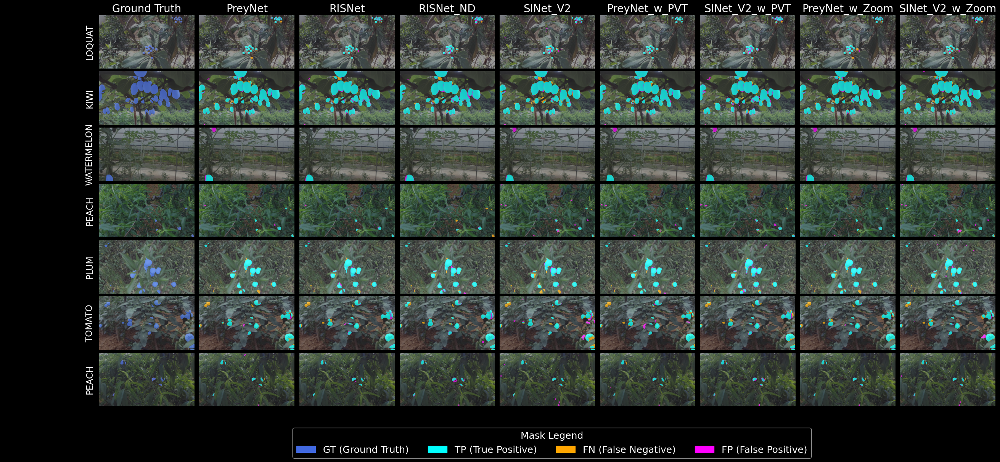

In [12]:
utils.display_images2(images=7, 
                     image_files=ACOD_results_list, 
                     save_path=f"results-general.png", networks=networks, pred_network_roots=pred_roots)

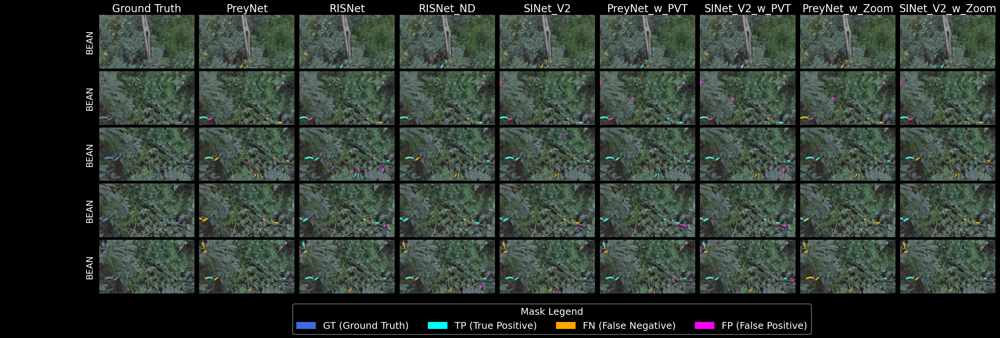

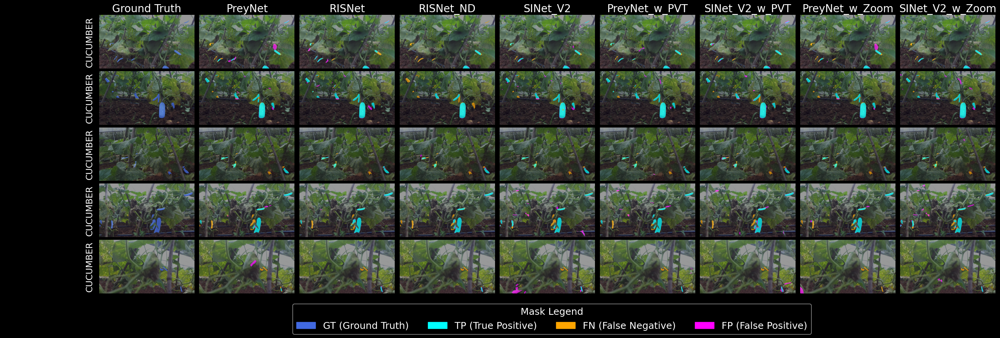

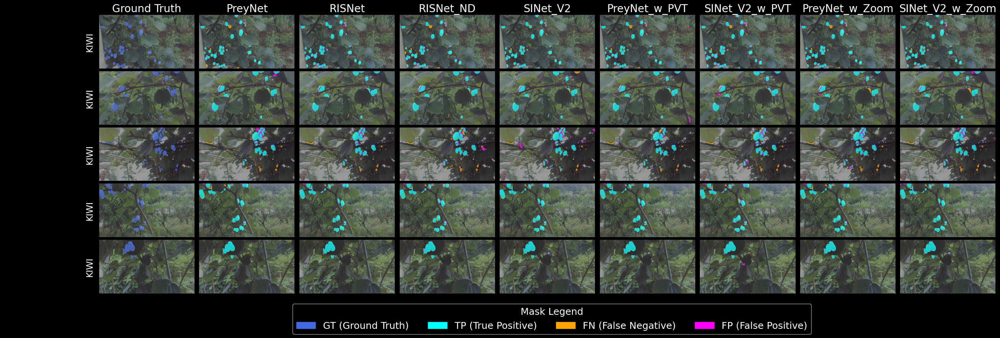

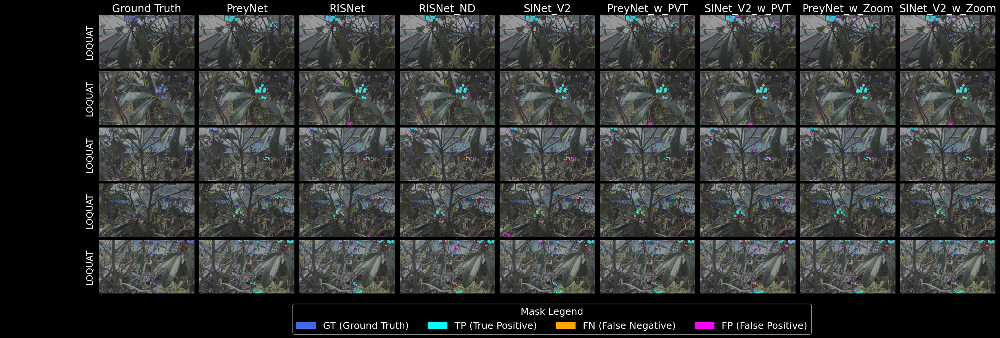

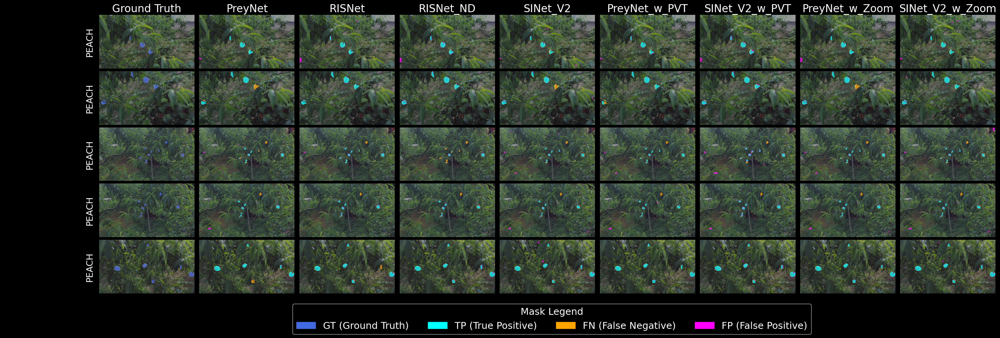

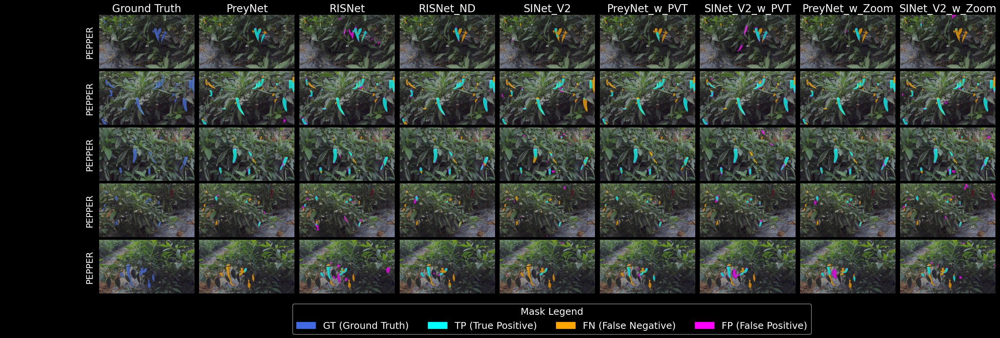

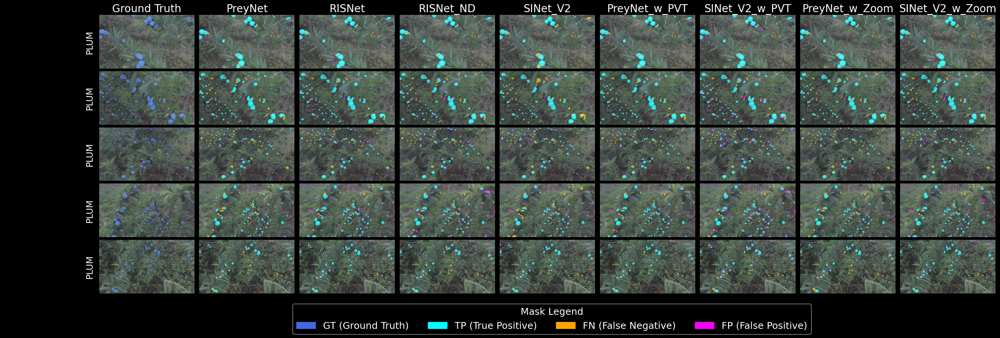

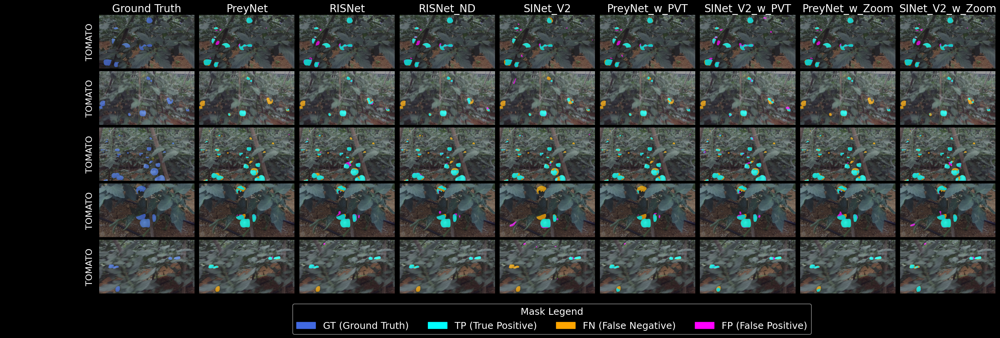

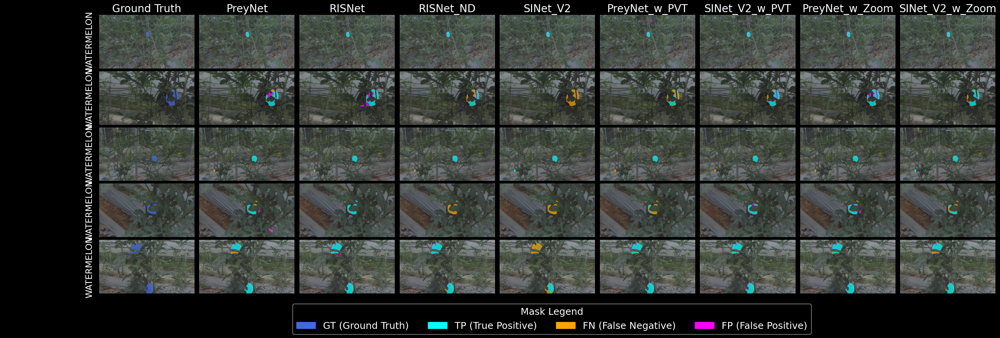

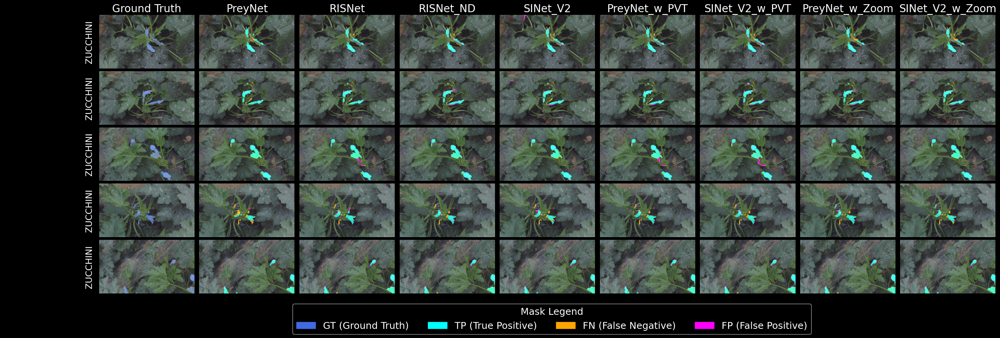

In [13]:
for plant in plants:
    utils.display_images2(images=5, image_files=ACOD_results[plant],  
                         save_path="results-{}.png".format(plant), networks=networks, pred_network_roots=pred_roots)

# Performance Comparisons

In [14]:
import pandas as pd

# Read acod_eval_averages.csv
acod_averages_df = pd.read_csv("Data/acod_eval_averages.csv")

# List of networks to exclude
# excluded_networks = ["PreyNet_w_PVT", "SINet_V2_w_PVT"]
excluded_networks = []


# Remove them from the DataFrame
acod_averages_df = acod_averages_df[~acod_averages_df["Network"].isin(excluded_networks)]

top_networks = set()
metrics = ['S', 'FWB', 'E']

for metric in metrics:
    top_networks.update(
        acod_averages_df.sort_values(by=[metric], ascending=False)["Network"].head(3).tolist()
    )
print(top_networks)

{'PreyNet_w_Zoom', 'RISNet', 'SINet_V2_w_PVT', 'SINet_V2_w_Zoom', 'PreyNet_w_PVT'}


In [15]:
acod_all_df = pd.DataFrame()
for network in networks:
    network_df = pd.read_csv(f"Data/acod_results_{network}.csv")
    acod_all_df = pd.concat([acod_all_df, network_df], ignore_index=True)
    
acod_all_df

,Network,Class,S,FWB,E,MAE,Plant
0,PreyNet,AVERAGE,0.842,0.751,0.953,0.008,NaN
1,PreyNet,NaN,0.583,0.198,0.530,0.005,bean
2,PreyNet,NaN,0.820,0.717,0.938,0.008,cucumber
3,PreyNet,NaN,0.902,0.864,0.983,0.007,kiwi
4,PreyNet,NaN,0.832,0.776,0.986,0.005,loquat
...,...,...,...,...,...,...,...
83,SINet_V2_w_Zoom,NaN,0.732,0.542,0.911,0.016,pepper
84,SINet_V2_w_Zoom,NaN,0.795,0.651,0.951,0.022,plum
85,SINet_V2_w_Zoom,NaN,0.852,0.790,0.972,0.011,tomato
86,SINet_V2_w_Zoom,NaN,0.901,0.870,0.982,0.003,watermelon


In [16]:
acod_plant_avgs_df = acod_all_df[~(acod_all_df["Class"]=="AVERAGE")].drop(columns=["Network", "Class", "MAE"]).groupby("Plant").mean().reset_index()
acod_plant_avgs_df.iloc[:, 1:4] *= 100
acod_plant_avgs_df

,Plant,S,FWB,E
0,bean,66.3000,40.1500,78.1250
1,cucumber,82.3250,73.4250,95.3125
2,kiwi,89.0625,85.7750,98.4625
3,loquat,81.5625,76.0000,98.3250
4,peach,82.5375,71.8375,96.4250
5,pepper,72.5375,52.3375,88.7000
6,plum,77.9500,62.2250,93.4375
7,tomato,84.9875,77.9000,96.6875
8,watermelon,90.5750,84.9250,96.5625
9,zucchini,86.4250,80.2250,98.1000


In [17]:
acod_plant_points_df = acod_all_df[(acod_all_df["Plant"].isin(acod_all_df["Plant"].dropna()))].drop(columns=["Class", "MAE"])
acod_plant_points_df.iloc[:, 1:4] *= 100
acod_plant_points_df

,Network,S,FWB,E,Plant
1,PreyNet,58.3,19.8,53.0,bean
2,PreyNet,82.0,71.7,93.8,cucumber
3,PreyNet,90.2,86.4,98.3,kiwi
4,PreyNet,83.2,77.6,98.6,loquat
5,PreyNet,84.6,74.8,96.5,peach
...,...,...,...,...,...
83,SINet_V2_w_Zoom,73.2,54.2,91.1,pepper
84,SINet_V2_w_Zoom,79.5,65.1,95.1,plum
85,SINet_V2_w_Zoom,85.2,79.0,97.2,tomato
86,SINet_V2_w_Zoom,90.1,87.0,98.2,watermelon


In [18]:
# excluded_networks = ["RISNet_ND"]
excluded_networks = []

acod_plant_vis_df = acod_plant_points_df[~acod_plant_points_df["Network"].isin(excluded_networks)]

In [19]:
acod_metric_avg_df = acod_plant_vis_df.drop(columns=["Network", "Plant"]).mean()
avg_metrics = dict(set(acod_metric_avg_df.items()))
avg_metrics

{'FWB': 70.47999999999999, 'S': 81.42625, 'E': 94.01374999999999}

C:\Users\Luis Razon\AppData\Local\Temp\ipykernel_5888\2656025451.py:47: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
C:\Users\Luis Razon\AppData\Local\Temp\ipykernel_5888\2656025451.py:47: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(
C:\Users\Luis Razon\AppData\Local\Temp\ipykernel_5888\2656025451.py:47: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(


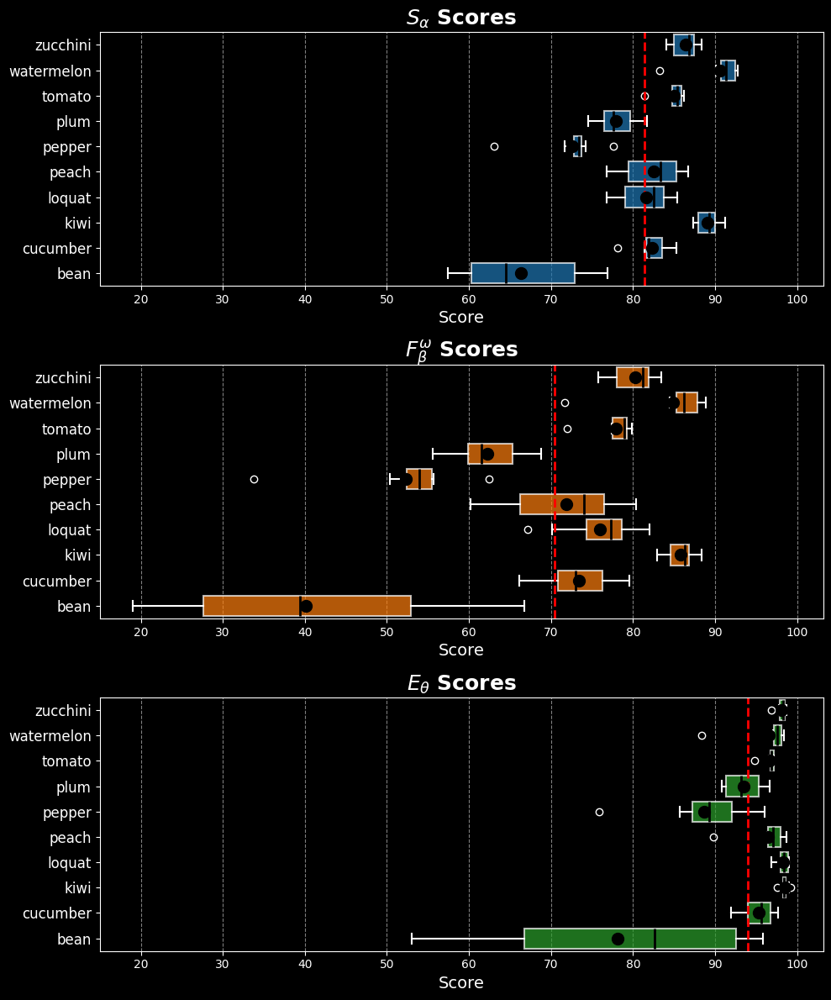

In [20]:
import matplotlib.pyplot as plt
import pandas as pd

# -----------------------------
# Configuration
# -----------------------------
MEASURE_COLORS = {
    "S": "#1f77b4",
    "FWB": "#ff7f0e",
    "E": "#2ca02c"
}

MEASURE_GREEK = {
    "S": r"$S_\alpha$",
    "FWB": r"$F^\omega_\beta$",
    "E": r"$E_\theta$"
}

MEASURE_THRESHOLDS = avg_metrics

AXIS_LABEL_SIZE = 14
TICK_LABEL_SIZE = 12
TITLE_SIZE = 18
NETWORK_FONT_SIZE = 12
FIGSIZE = (10, 12)
BOX_WIDTH = 0.8
MARKER_SIZE = 10

measures = ["S", "FWB", "E"]
plants = sorted(acod_plant_vis_df["Plant"].unique())

# -----------------------------
# Plot
# -----------------------------
fig, axes = plt.subplots(
    nrows=len(measures),
    ncols=1,
    figsize=FIGSIZE,
    sharex=True
)

for ax, measure in zip(axes, measures):

    # Gather all scores for each plant
    data = [acod_plant_vis_df.loc[acod_plant_vis_df["Plant"] == plant, measure].values for plant in plants]

    bp = ax.boxplot(
        data,
        vert=False,
        patch_artist=True,
        showmeans=True,
        widths=BOX_WIDTH,
        labels=plants
    )

    # Box styling
    for box in bp["boxes"]:
        box.set(facecolor=MEASURE_COLORS[measure], alpha=0.7, linewidth=1.5)

    # Median line
    for median in bp["medians"]:
        median.set(color="black", linewidth=2)

    # Mean markers
    for mean in bp["means"]:
        mean.set(marker="o", markerfacecolor="black", markeredgecolor="black", markersize=MARKER_SIZE)

    # Whiskers and caps
    for whisker in bp["whiskers"]:
        whisker.set(linewidth=1.5)
    for cap in bp["caps"]:
        cap.set(linewidth=1.5)

    # Grid
    ax.grid(axis="x", linestyle="--", alpha=0.5)

    # Threshold line
    ax.axvline(
        x=MEASURE_THRESHOLDS[measure],
        color="red",
        linestyle="--",
        linewidth=2
    )

    # Optional: log scale if needed
    # ax.set_xscale("log")

    # Labels and title
    ax.set_xlabel("Score", fontsize=AXIS_LABEL_SIZE)
    ax.tick_params(axis="x", labelbottom=True)
    ax.set_title(f"{MEASURE_GREEK[measure]} Scores", fontsize=TITLE_SIZE, fontweight="bold")
    ax.tick_params(axis="y", labelsize=NETWORK_FONT_SIZE)

plt.tight_layout()
plt.show()
fig.savefig("plant_boxplot_by_network.png", dpi=150, bbox_inches="tight")


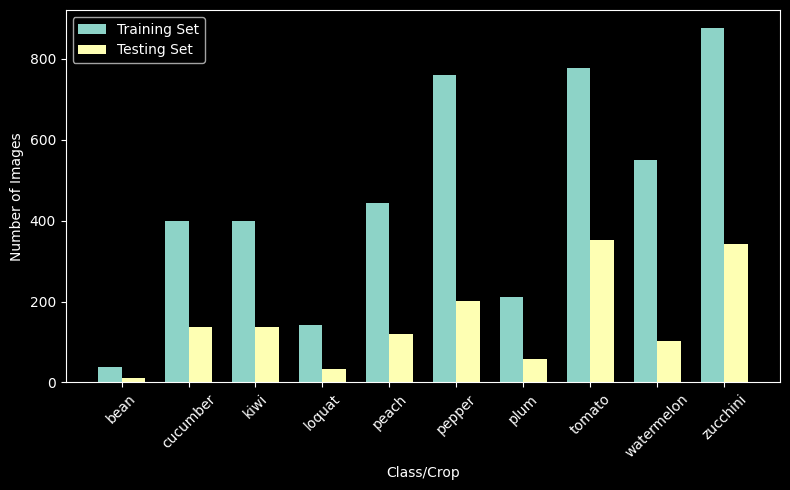

In [21]:
x = np.arange(len(plants))
width = 0.35

fig = plt.figure(figsize=(8, 5))
plt.bar(x - width/2, train_count.values(), width, label="Training Set")
plt.bar(x + width/2, test_count.values(),  width, label="Testing Set")

plt.xticks(x, plants, rotation=45)
plt.ylabel("Number of Images")
plt.xlabel("Class/Crop")
#plt.title("Training vs Testing Image Counts per Plant")
plt.legend()
plt.tight_layout()
plt.show()

fig.savefig("dataset-counts.png", dpi=150, bbox_inches="tight")

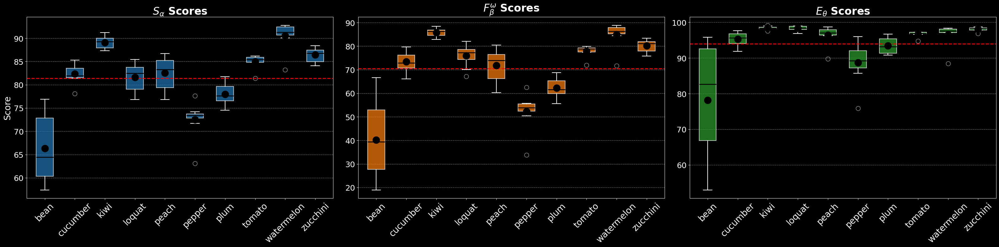

In [22]:
import matplotlib.pyplot as plt
import pandas as pd

# -----------------------------
# Configuration
# -----------------------------
MEASURE_COLORS = {
    "S": "#1f77b4",
    "FWB": "#ff7f0e",
    "E": "#2ca02c"
}

MEASURE_GREEK = {
    "S": r"$S_\alpha$",
    "FWB": r"$F^\omega_\beta$",
    "E": r"$E_\theta$"
}

MEASURE_THRESHOLDS = avg_metrics

AXIS_LABEL_SIZE = 20
TICK_LABEL_SIZE = 18
TITLE_SIZE = 24
NETWORK_FONT_SIZE = 20
FIGSIZE = (32, 8)
BOX_WIDTH = 2.0
MARKER_SIZE = 16
BOX_SPACING = 3.5
EDGE_PADDING = 0.6   

measures = ["S", "FWB", "E"]
plants = sorted(acod_plant_vis_df["Plant"].unique())

# -----------------------------
# Plot
# -----------------------------
fig, axes = plt.subplots(
    nrows=1,
    ncols=len(measures),
    figsize=FIGSIZE,
    sharex=True
)

for ax, measure in zip(axes, measures):

    # Gather all scores for each plant
    data = [
        acod_plant_vis_df.loc[
            acod_plant_vis_df["Plant"] == plant, measure
        ].values
        for plant in plants
    ]

    positions = np.arange(len(plants)) * BOX_SPACING + 1
    bp = ax.boxplot(
        data,
        positions=positions,
        patch_artist=True,
        showmeans=True,
        widths=BOX_WIDTH,
        flierprops=dict(
            marker='o',
            markersize=10,
            alpha=0.6
        )
    )
    
    # Box styling
    for box in bp["boxes"]:
        box.set(facecolor=MEASURE_COLORS[measure], alpha=0.7, linewidth=1.5)

    # Median line
    for median in bp["medians"]:
        median.set(color="black", linewidth=2)

    # Mean markers
    for mean in bp["means"]:
        mean.set(
            marker="o",
            markerfacecolor="black",
            markeredgecolor="black",
            markersize=MARKER_SIZE
        )

    # Whiskers and caps
    for whisker in bp["whiskers"]:
        whisker.set(linewidth=1.5)
    for cap in bp["caps"]:
        cap.set(linewidth=1.5)

    # Grid (now on y-axis)
    ax.grid(axis="y", linestyle="--", alpha=0.5)

    # Threshold line (horizontal now)
    ax.axhline(
        y=MEASURE_THRESHOLDS[measure],
        color="red",
        linestyle="--",
        linewidth=2
    )

    # Labels and title
    if measure == "S":
        ax.set_ylabel("Score", fontsize=AXIS_LABEL_SIZE)
    ax.tick_params(axis="y", labelsize=TICK_LABEL_SIZE)
    ax.set_title(
        f"{MEASURE_GREEK[measure]} Scores",
        fontsize=TITLE_SIZE,
        fontweight="bold"
    )
    ax.tick_params(axis="x", labelsize=NETWORK_FONT_SIZE, labelbottom=True)
    ax.set_xticks(positions)
    ax.set_xticklabels(plants, rotation=45)
    ax.set_xlim(
        positions[0] - EDGE_PADDING * BOX_SPACING,
        positions[-1] + EDGE_PADDING * BOX_SPACING
    )

plt.tight_layout()
plt.show()
fig.savefig("plant_boxplot_by_network.png", dpi=150, bbox_inches="tight")


In [23]:
acod_plant_measures_df = acod_plant_avgs_df.copy()
acod_plant_measures_df.loc[:, "Class"] = "AVERAGE"
difficult_crops = ["bean", "plum", "pepper"]
top_networks_difficult_crops = set()
for plant in plants:
    for metric in metrics:
        #Get best and worst networks for each plant and metric
        plant_metric_df = acod_plant_points_df[
            (acod_all_df["Plant"] == plant)
        ].sort_values(by=[metric], ascending=False)

        # Isolate worst and best and add to acod_plant_measures_df
        best_rows = plant_metric_df.head(3).copy()
        worst_rows = plant_metric_df.tail(3).copy()
        
        best_rows["Class"] = [
            f"{plant.capitalize()}_{metric}_1stB",
            f"{plant.capitalize()}_{metric}_2ndB",
            f"{plant.capitalize()}_{metric}_3rdB",
        ]
        
        worst_rows["Class"] = [
            f"{plant.capitalize()}_{metric}_3rdW",
            f"{plant.capitalize()}_{metric}_2ndW",
            f"{plant.capitalize()}_{metric}_1stW",
        ]
        
        if plant in difficult_crops:
            top_networks_difficult_crops.update(best_rows["Network"].to_list())
        acod_plant_measures_df = pd.concat([acod_plant_measures_df, best_rows, worst_rows], ignore_index=True)


#acod_plant_measures_df.drop(columns=["MAE"], inplace=True)
pd.DataFrame(acod_plant_measures_df).to_csv("Data/acod_plant_measures.csv", index=False)
acod_plant_measures_df

C:\Users\Luis Razon\AppData\Local\Temp\ipykernel_5888\4079783692.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plant_metric_df = acod_plant_points_df[
C:\Users\Luis Razon\AppData\Local\Temp\ipykernel_5888\4079783692.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plant_metric_df = acod_plant_points_df[
C:\Users\Luis Razon\AppData\Local\Temp\ipykernel_5888\4079783692.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plant_metric_df = acod_plant_points_df[
C:\Users\Luis Razon\AppData\Local\Temp\ipykernel_5888\4079783692.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plant_metric_df = acod_plant_points_df[
C:\Users\Luis Razon\AppData\Local\Temp\ipykernel_5888\4079783692.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  plant_metric_df = acod_plant_points_df[
C:\Users\Luis Razon\AppData\Local\Temp\ipykernel_5888\4

,Plant,S,FWB,E,Class,Network
0,bean,66.3000,40.1500,78.1250,AVERAGE,NaN
1,cucumber,82.3250,73.4250,95.3125,AVERAGE,NaN
2,kiwi,89.0625,85.7750,98.4625,AVERAGE,NaN
3,loquat,81.5625,76.0000,98.3250,AVERAGE,NaN
4,peach,82.5375,71.8375,96.4250,AVERAGE,NaN
...,...,...,...,...,...,...
185,zucchini,88.2000,83.3000,98.6000,Zucchini_E_2ndB,RISNet
186,zucchini,87.2000,81.5000,98.4000,Zucchini_E_3rdB,PreyNet_w_Zoom
187,zucchini,84.9000,78.2000,97.9000,Zucchini_E_3rdW,SINet_V2_w_PVT
188,zucchini,85.0000,77.3000,97.8000,Zucchini_E_2ndW,SINet_V2


In [24]:
top_networks_difficult_crops

{'PreyNet_w_PVT',
 'PreyNet_w_Zoom',
 'RISNet',
 'SINet_V2_w_PVT',
 'SINet_V2_w_Zoom'}

           Network      S    FWB      E    MAE
3         SINet_V2  0.792  0.674  0.927  0.012
2        RISNet_ND  0.823  0.713  0.942  0.010
6   SINet_V2_w_PVT  0.826  0.734  0.970  0.011
7  SINet_V2_w_Zoom  0.837  0.757  0.967  0.009
1          PreyNet  0.842  0.751  0.953  0.008
5   PreyNet_w_Zoom  0.843  0.754  0.957  0.008
4    PreyNet_w_PVT  0.855  0.780  0.966  0.008
0           RISNet  0.859  0.788  0.976  0.008


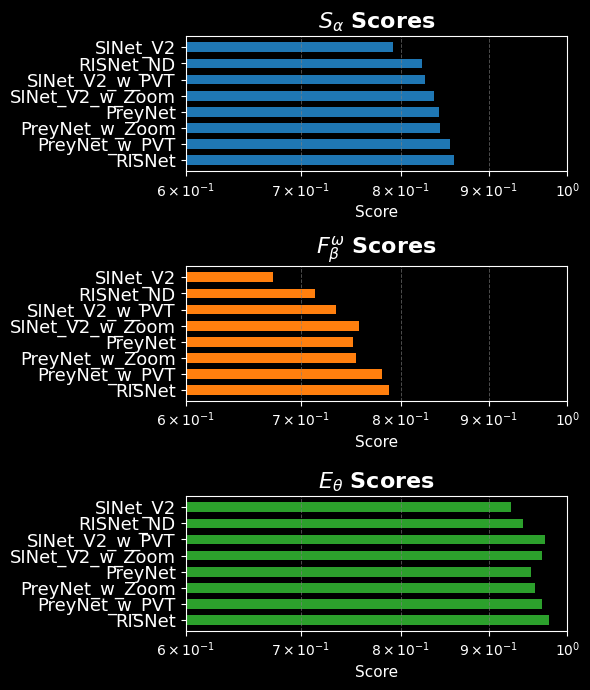

In [25]:
import matplotlib.pyplot as plt

# -----------------------------
# Configuration (paper-ready)
# -----------------------------
MEASURE_COLORS = {
    "S": "#1f77b4",    # blue
    "FWB": "#ff7f0e",  # orange
    "E": "#2ca02c"     # green
}

# Greek symbols for measures (LaTeX-style)
MEASURE_GREEK = {
    "S": r"$S_\alpha$",
    "FWB": r"$F^\omega_\beta$",
    "E": r"$E_\theta$"
}

NETWORK_FONT_SIZE = 13
AXIS_LABEL_SIZE = 11
TICK_LABEL_SIZE = 10
TITLE_SIZE = 16

# -----------------------------
# Data preparation
# -----------------------------
# top_df = acod_averages_df[
#     acod_averages_df["Network"].isin(top_networks_difficult_crops)
# ].copy()

top_df = acod_averages_df.copy()

top_df.sort_values(by=metrics, ascending=True, inplace=True)

print(top_df)

measures = ["S", "FWB", "E"]

# -----------------------------
# Plot
# -----------------------------
fig, axes = plt.subplots(
    nrows=len(measures),
    ncols=1,
    figsize=(6, 7),
    sharey=True
)

y = range(len(top_df))

for ax, measure in zip(axes, measures):
    ax.barh(
        y,
        top_df[measure],
        height=0.6,
        color=MEASURE_COLORS[measure]
    )

    ax.set_xscale("log")
    ax.set_xticks([0.6, 0.7, 0.8, 0.9, 1.0])
    ax.set_xlabel("Score", fontsize=AXIS_LABEL_SIZE)

    # Greek symbol title
    ax.set_title(
        f"{MEASURE_GREEK[measure]} Scores",
        fontsize=TITLE_SIZE,
        fontweight="bold"
    )

    # Vertical guidelines
    for xt in ax.get_xticks():
        ax.axvline(
            x=xt,
            color="gray",
            linestyle="--",
            linewidth=0.7,
            alpha=0.6
        )

    # Consistent tick sizes
    ax.tick_params(axis="x", labelsize=TICK_LABEL_SIZE)
    ax.tick_params(axis="y", labelsize=NETWORK_FONT_SIZE)

# Y-axis labels (networks)
axes[0].set_yticks(y)
axes[0].set_yticklabels(
    top_df["Network"],
    fontsize=NETWORK_FONT_SIZE
)
axes[0].invert_yaxis()

plt.tight_layout()
plt.show()

fig.savefig("currentperformance.png", dpi=100, bbox_inches='tight')


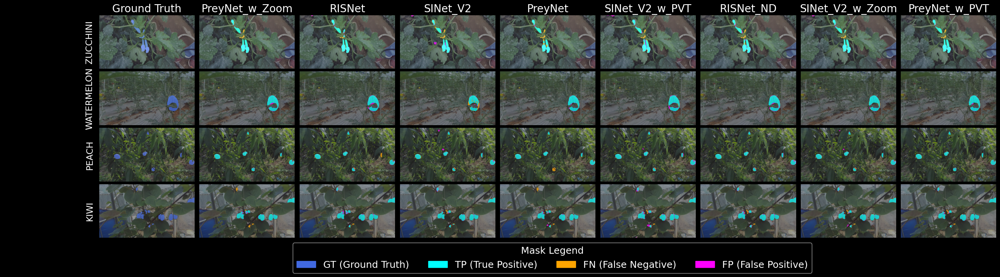

In [26]:
importlib.reload(utils)
top_networks_difficult_crops = list(top_networks_difficult_crops)
# top_networks = list(top_networks)
top_networks = list(set(acod_all_df["Network"]))

utils.display_images2(images=4, 
                      image_files=ACOD_results_list, 
                      save_path=f"results-top.png", 
                      networks=top_networks, pred_network_roots=["Results/" + network + "/ACOD-12K/" for network in top_networks])

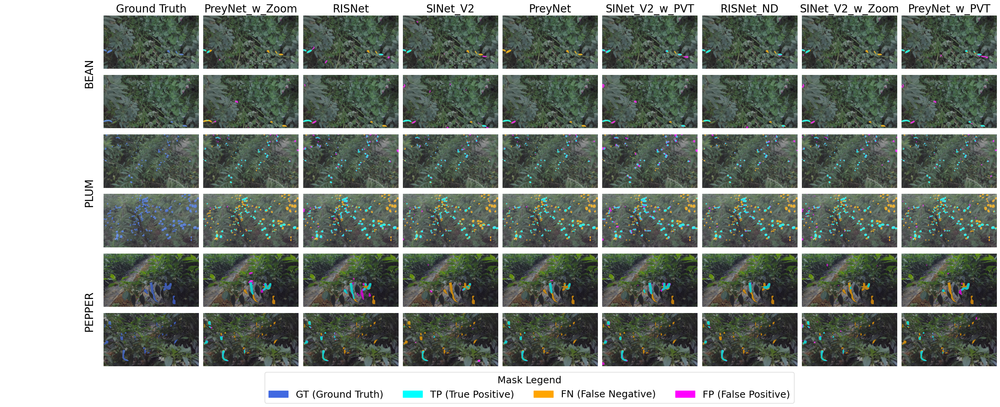

In [33]:
importlib.reload(utils)
utils.display_images3(images=2, 
                      image_files=ACOD_results, 
                      title=f"Difficult Crop Results for Top Performing Networks for ACOD-12K", 
                      save_path=f"results-difficult-crops-top.png", 
                      networks=top_networks,
                      crops=difficult_crops,
                      pred_network_roots=["Results/" + network + "/ACOD-12K/" for network in top_networks], label_fontsize=20)

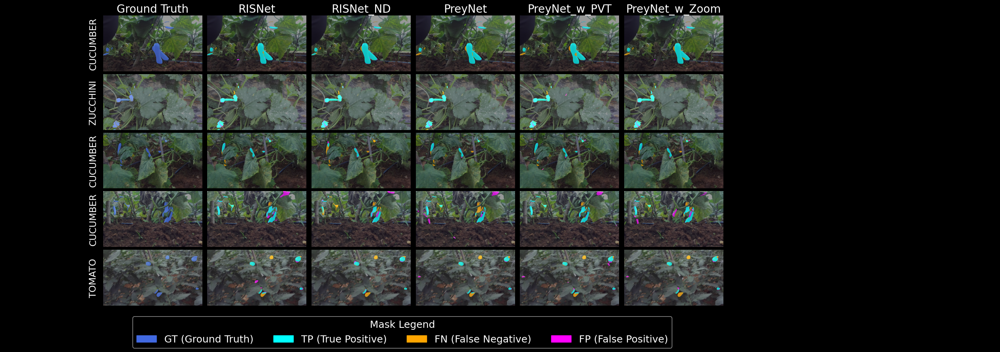

In [31]:
PreyNet_Networks = ["RISNet", "RISNet_ND", "PreyNet", "PreyNet_w_PVT", "PreyNet_w_Zoom"]
utils.display_images2(images=5, image_files=ACOD_results_list, save_path=f"PreyNet-aug-comp.png", networks=PreyNet_Networks, pred_network_roots=["Results/" + network + "/ACOD-12K/" for network in PreyNet_Networks])

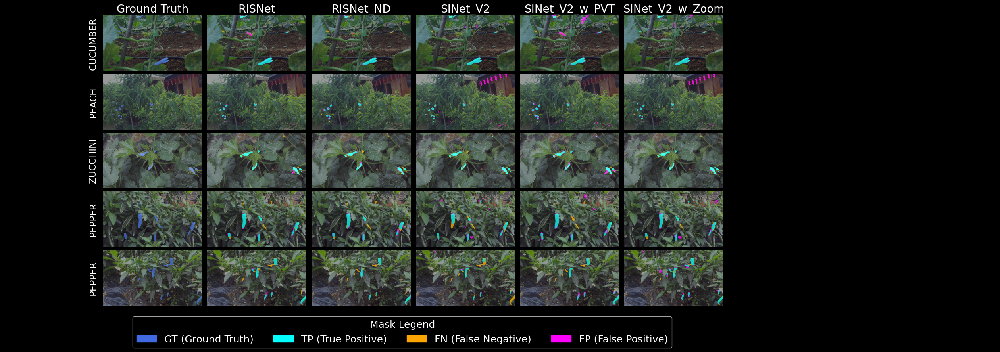

In [29]:
SINetV2_Networks = ["RISNet", "RISNet_ND", "SINet_V2", "SINet_V2_w_PVT", "SINet_V2_w_Zoom"]
utils.display_images2(images=5, image_files=ACOD_results_list, save_path=f"SINetV2-aug-comp.png", networks=SINetV2_Networks, pred_network_roots=["Results/" + network + "/ACOD-12K/" for network in SINetV2_Networks])